# Inspect trajectories makes some geo binned HF energy aberant (cf diag_geo_band_integration.ipynb)
- Identify these trajectories
- Inspect them

In [1]:
import os

import numpy as np
import pandas as pd
import xarray as xr
import dask.dataframe as dd

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geopandas as gpd
from shapely.geometry import Polygon

%matplotlib inline
from matplotlib import pyplot as plt
import hvplot.pandas
import holoviews as hv

import drifters.utils as ut
import pynsitu as pin
from GDP_lib import root_dir, negpos_spectra

In [2]:
from dask.distributed import Client

if True:
    from dask.distributed import Client
    from dask_jobqueue import PBSCluster

    # cluster = PBSCluster(cores=56, processes=28, walltime='04:00:00')
    # cluster = PBSCluster(cores=7, processes=7, walltime='04:00:00')
    cluster = PBSCluster(cores=3, processes=3, walltime="04:00:00")
    w = cluster.scale(jobs=8)
    # from dask_jobqueue import PBSCluster
    # cluster = PBSCluster()
    # w = cluster.scale(jobs=8) # 5 for gps, 8 for argos
else:
    from dask.distributed import LocalCluster

    cluster = LocalCluster()

client = Client(cluster)
client

/home1/datahome/mdemol/.miniconda3/envs/mdenv/lib/python3.9/site-packages/dask_jobqueue/core.py:237: FutureWarning: extra has been renamed to worker_extra_args. You are still using it (even if only set to []; please also check config files). If you did not set worker_extra_args yet, extra will be respected for now, but it will be removed in a future release. If you already set worker_extra_args, extra is ignored and you can remove it.
  warnings.warn(warn, FutureWarning)
/home1/datahome/mdemol/.miniconda3/envs/mdenv/lib/python3.9/site-packages/dask_jobqueue/core.py:255: FutureWarning: job_extra has been renamed to job_extra_directives. You are still using it (even if only set to []; please also check config files). If you did not set job_extra_directives yet, job_extra will be respected for now, but it will be removed in a future release. If you already set job_extra_directives, job_extra is ignored and you can remove it.
  warnings.warn(warn, FutureWarning)
/home1/datahome/mdemol/.min

Connection method: Cluster object,Cluster type: dask_jobqueue.PBSCluster
Dashboard: http://10.148.0.104:8787/status,
Dashboard: http://10.148.0.104:8787/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://10.148.0.104:58406,Workers: 0
Dashboard: http://10.148.0.104:8787/status,Total threads: 0
Started: Just now,Total memory: 0 B


# Choose key 

In [4]:
key = "gps"  # 'gps' or 'argos'
key2 = "_corrected"  # or '_corrected'

___
# Generate 60 days window mean cinetic nrj

In [5]:
# drop all variables but relevant ones
col = [
    "id",
    "time",
    "lon",
    "lat",
    "x",
    "y",
    "ve",
    "vn",
    "ae",
    "an",
    "vex",
    "vny",
    "aex",
    "any",
    "ae_vex",
    "an_vny",
    "vex_diff",
    "vny_diff",
    "err_lon",
    "err_lat",
    "err_ve",
    "err_vn",
]

In [6]:
# LOAD files with velocities and accelerations computed
parquet = os.path.join(root_dir, key + "_av_time" + key2 + ".parquet")
df = dd.read_parquet(parquet).reset_index()[col].persist()
df = df.rename(columns={"time": "date"})
df["ven2"] = df.ve**2 + df.vn**2

# add time in hours
time_unit = pd.Timedelta("1H")
t_ref = pd.Timestamp(2000, 1, 1)
df["time"] = (df["date"] - t_ref) / time_unit

T_str = "60D"  # days, time window given to pin.drifters.time_window_processing
dt = "1H"  # sampling

N = int(pd.Timedelta(T_str) / pd.Timedelta(dt))  # output size
T = pd.Timedelta(T_str) / time_unit  # must be in the same units than time


def nrj(lon, lat, ve, vn, N, dt):
    # print(f'lon: {lon},\n lat:{lat},\n ve:{ve},\n vn:{vn},\n N : {N}, dt:{dt}\n \n')
    if ve is None:
        return pd.Series(0.1)
    else:
        # print(np.sqrt(ve**2+ vn**2))
        return pd.Series((ve**2 + vn**2).mean())


def process_uv(lon, lat, u, v, N, dt, **kwargs):
    """Wraps spectral calculation: add complex velocity
    Assumes the time series is regularly sampled

    Parameters:
    -----------
        u, v: pd.Series
            zonal, meridional index by time (in days)
        N: int,
            length of the spectrum
        dt: float
            Time sampling in days
        **kwargs:
            passed to mit_equinox.drifters.get_spectrum
    """
    if lon is None:
        uv = None
    else:
        uv = u + 1j * v
    return pin.tseries.get_spectrum(uv, N, dt=dt, **kwargs)


# pin.drifters.
group = tuple(df.get_partition(0)["id"].loc[0].values.compute())[0]
dfg = df.groupby("id").get_group(group).compute()

outs = pin.drifters.time_window_processing(
    dfg, process_uv, ["lon", "lat", "ve", "vn"], T, N, id_label="id", dt=dt, geo=True
)
out = pin.drifters.time_window_processing(
    dfg, nrj, ["lon", "lat", "ve", "vn"], T, N=1, id_label="id", dt=dt, geo=True
)

df_nrj = df.groupby("id").apply(
    pin.drifters.time_window_processing,
    nrj,
    ["lon", "lat", "ve", "vn"],
    T,
    N=1,
    id_label="id",
    dt=dt,
    geo=True,
    meta=out,
)
df_nrj = (
    df_nrj.rename(columns={"x": "lon", "y": "lat", 0: "ven2"})
    .repartition(partition_size="100MB")
    .persist()
)

In [11]:
out

,x,y,id,0
13850.0,-91.664059,3.558864,22192.0,0.078472
14570.0,-92.556271,2.910508,22192.0,0.116655
15290.0,-100.531712,1.245543,22192.0,0.368485
16010.0,-110.107266,-1.717577,22192.0,0.308725


In [12]:
outs

,x,y,id,0.0,0.016666666666666666,0.03333333333333333,0.05,0.06666666666666667,0.08333333333333333,0.1,...,-0.16666666666666666,-0.15,-0.13333333333333333,-0.11666666666666667,-0.1,-0.08333333333333333,-0.06666666666666667,-0.05,-0.03333333333333333,-0.016666666666666666
13850.0,-91.664059,3.558864,22192.0,0.089993,0.007925,0.080207,0.036749,0.007239,0.003791,0.001309,...,0.021432,0.149978,0.347112,0.446985,0.216979,0.047483,0.068371,0.133665,0.071354,0.007634
14570.0,-92.556271,2.910508,22192.0,0.582165,0.398766,0.043822,0.005096,0.006477,0.012879,0.015144,...,0.053474,0.032386,0.111352,0.197273,0.263843,0.162328,0.054595,0.139463,0.051812,0.510923
15290.0,-100.531712,1.245543,22192.0,13.875751,5.595187,0.507043,0.221491,0.020230,0.030312,0.019948,...,0.087056,0.029171,0.035611,0.100678,0.079065,0.103643,0.248163,0.082820,0.286755,2.936012
16010.0,-110.107266,-1.717577,22192.0,3.576124,0.725300,3.346217,2.425059,0.498373,0.164430,0.094403,...,0.006931,0.010905,0.010974,0.025010,0.083454,0.176001,0.194727,0.144771,0.461444,0.618104


In [13]:
df_nrj

,lon,lat,id,ven2
npartitions=1,,,,
,float64,float64,float64,float64
,...,...,...,...


integration by sum*df do not give the correct nrj

___
# Select

<AxesSubplot: >

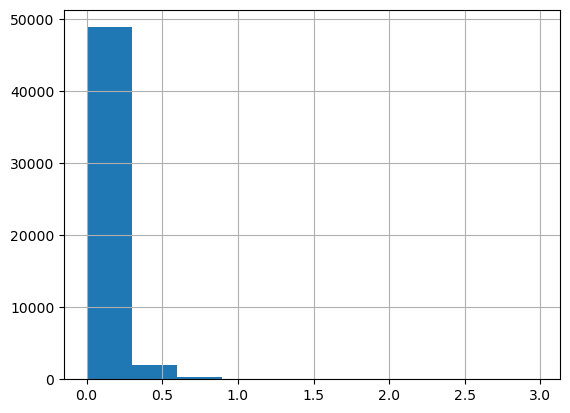

In [19]:
DF["ven"].ven2.compute().hist()

In [109]:
q = df_nrj.ven2.quantile(0.999).compute()
list_id = list(df_nrj[df_nrj.ven2 > q].id.unique().values.compute())
list_id

[66314260.0,
 66432900.0,
 66312850.0,
 63347250.0,
 64015000.0,
 65411730.0,
 66432050.0,
 63354000.0,
 63473570.0,
 65385680.0,
 65317720.0,
 65317890.0,
 65333510.0,
 63947730.0,
 65410640.0,
 63353030.0,
 66314450.0,
 63354010.0,
 64830280.0,
 65411840.0,
 63510950.0,
 65702620.0,
 63942930.0,
 65410650.0,
 63941880.0,
 63354040.0,
 64909860.0,
 63943730.0,
 63944940.0,
 63897840.0,
 63245740.0,
 63251220.0,
 66432330.0,
 63251230.0,
 66314050.0,
 66314430.0,
 66432410.0,
 63942720.0,
 64903870.0,
 12724770.0,
 65411970.0]

In [117]:
dfpb

,index,id,date,lon,lat,x,y,ve,vn,ae,...,any,ae_vex,an_vny,vex_diff,vny_diff,err_lon,err_lat,err_ve,err_vn,ven2
time,,,,,,,,,,,,,,,,,,,,,
151785.0,164311,63510950,2017-04-25 09:00:00,-64.343987,17.866800,0.000000e+00,0.000000e+00,0.0694,0.1900,NaN,...,NaN,NaN,NaN,NaN,NaN,0.00089,0.00085,0.0369,0.0369,0.040916
151786.0,165020,63510950,2017-04-25 10:00:00,-64.341568,17.872250,2.563169e+02,6.031237e+02,0.0738,0.1407,0.000002,...,-2.220163e-05,3.087908e-06,-0.000027,0.075915,0.127572,0.00058,0.00055,0.0185,0.0185,0.025243
151787.0,165224,63510950,2017-04-25 11:00:00,-64.338829,17.875099,5.465851e+02,9.185180e+02,0.0856,0.0488,0.000002,...,-1.980720e-05,1.637634e-06,-0.000019,0.083999,0.051957,0.00039,0.00037,0.0137,0.0137,0.009709
151788.0,166617,63510950,2017-04-25 12:00:00,-64.335861,17.875629,8.611115e+02,9.772159e+02,0.0903,-0.0190,0.000000,...,-1.580017e-05,3.120772e-07,-0.000014,0.087707,-0.012135,0.00053,0.00050,0.0185,0.0185,0.008515
151789.0,166912,63510950,2017-04-25 13:00:00,-64.332870,17.874310,1.178074e+03,8.311487e+02,0.0856,-0.0649,-0.000001,...,-5.033265e-06,7.332976e-07,-0.000005,0.086250,-0.049634,0.00039,0.00037,0.0137,0.0137,0.011539
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165438.0,5652,63510950,2018-11-15 06:00:00,-38.301910,46.150661,2.073329e+06,3.360477e+06,0.3758,-0.1042,-0.000006,...,4.873756e-06,-3.046332e-06,0.000004,0.426601,-0.014042,0.00072,0.00050,0.0184,0.0184,0.152083
165439.0,6477,63510950,2018-11-15 07:00:00,-38.284000,46.147610,2.074822e+06,3.360451e+06,0.3840,-0.0808,0.000011,...,6.382449e-06,8.157737e-06,0.000005,0.430728,0.008387,0.00053,0.00037,0.0137,0.0137,0.153985
165440.0,7478,63510950,2018-11-15 08:00:00,-38.264309,46.145302,2.076430e+06,3.360538e+06,0.4540,-0.0650,0.000019,...,2.458196e-06,1.481522e-05,0.000003,0.475307,0.035233,0.00053,0.00036,0.0137,0.0137,0.210341


In [122]:
id_ = 63897840.0
dfpb = df[df.id == id_].reset_index().set_index("time").compute()
hvplot = (
    dfpb["x"].hvplot(grid=True)
    + dfpb["y"].hvplot(grid=True)
    + dfpb["ve"].hvplot(grid=True) * dfpb["vex"].hvplot(grid=True)
    + dfpb["vn"].hvplot(grid=True) * dfpb["vny"].hvplot(grid=True)
    + dfpb["ae"].hvplot(grid=True) * dfpb["aex"].hvplot(grid=True)
    + dfpb["an"].hvplot(grid=True) * dfpb["any"].hvplot(grid=True)
)
layout = hv.Layout(hvplot).cols(2)
print(id_)
layout

63897840.0


:Layout
   .Curve.X     :Curve   [time]   (x)
   .Curve.Y     :Curve   [time]   (y)
   .Overlay.I   :Overlay
      .Curve.Ve  :Curve   [time]   (ve)
      .Curve.Vex :Curve   [time]   (vex)
   .Overlay.II  :Overlay
      .Curve.Vn  :Curve   [time]   (vn)
      .Curve.Vny :Curve   [time]   (vny)
   .Overlay.III :Overlay
      .Curve.Ae  :Curve   [time]   (ae)
      .Curve.Aex :Curve   [time]   (aex)
   .Overlay.IV  :Overlay
      .Curve.An  :Curve   [time]   (an)
      .Curve.Any :Curve   [time]   (any)

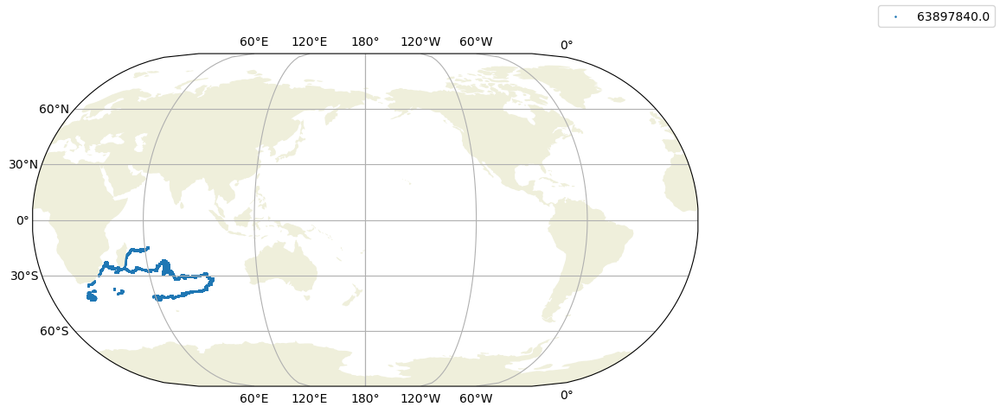

In [123]:
geo_plot(df, [id_])

In [120]:
id_ = 63245740.0
dfpb = df[df.id == id_].reset_index().set_index("time").compute()
hvplot = (
    dfpb["x"].hvplot(grid=True)
    + dfpb["y"].hvplot(grid=True)
    + dfpb["ve"].hvplot(grid=True) * dfpb["vex"].hvplot(grid=True)
    + dfpb["vn"].hvplot(grid=True) * dfpb["vny"].hvplot(grid=True)
    + dfpb["ae"].hvplot(grid=True) * dfpb["aex"].hvplot(grid=True)
    + dfpb["an"].hvplot(grid=True) * dfpb["any"].hvplot(grid=True)
)
layout = hv.Layout(hvplot).cols(2)
print(id_)
layout

63245740.0


:Layout
   .Curve.X     :Curve   [time]   (x)
   .Curve.Y     :Curve   [time]   (y)
   .Overlay.I   :Overlay
      .Curve.Ve  :Curve   [time]   (ve)
      .Curve.Vex :Curve   [time]   (vex)
   .Overlay.II  :Overlay
      .Curve.Vn  :Curve   [time]   (vn)
      .Curve.Vny :Curve   [time]   (vny)
   .Overlay.III :Overlay
      .Curve.Ae  :Curve   [time]   (ae)
      .Curve.Aex :Curve   [time]   (aex)
   .Overlay.IV  :Overlay
      .Curve.An  :Curve   [time]   (an)
      .Curve.Any :Curve   [time]   (any)

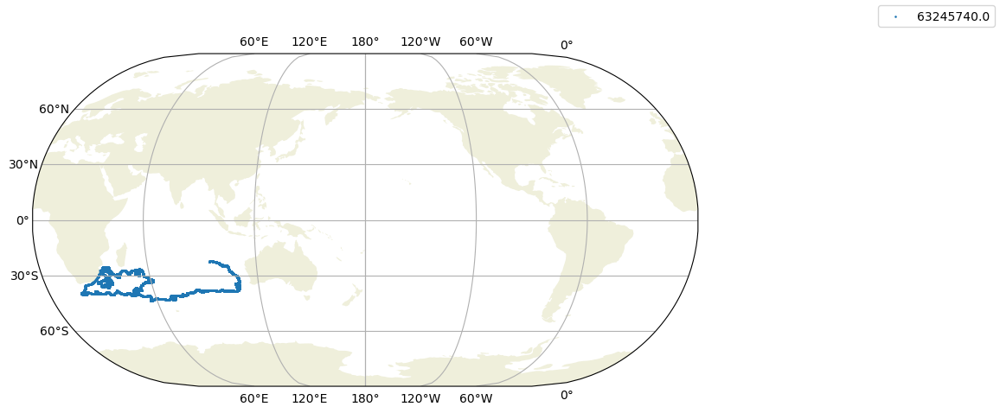

In [121]:
geo_plot(df, [id_])

In [112]:
def geo_plot(df, list_id, title="", legend="", **kwargs):
    fig = plt.figure(figsize=(15, 5))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.EckertIII(central_longitude=-180))
    ax.add_feature(cfeature.LAND, zorder=2)
    for id_ in list_id:
        dfpb = (
            df[df.id == id_].reset_index().set_index("time")[["lon", "lat"]].compute()
        )
        lon = np.array(dfpb.lon)
        lat = np.array(dfpb.lat)
        ax.scatter(
            lon, lat, marker=".", s=3, transform=ccrs.PlateCarree(), label=str(id_)
        )
    ax.set_extent([1e-4, -1e-4, -90, 90], ccrs.PlateCarree())
    ax.set_title(title, fontsize=15)
    gl = ax.gridlines(
        draw_labels=True,
    )
    fig.legend()

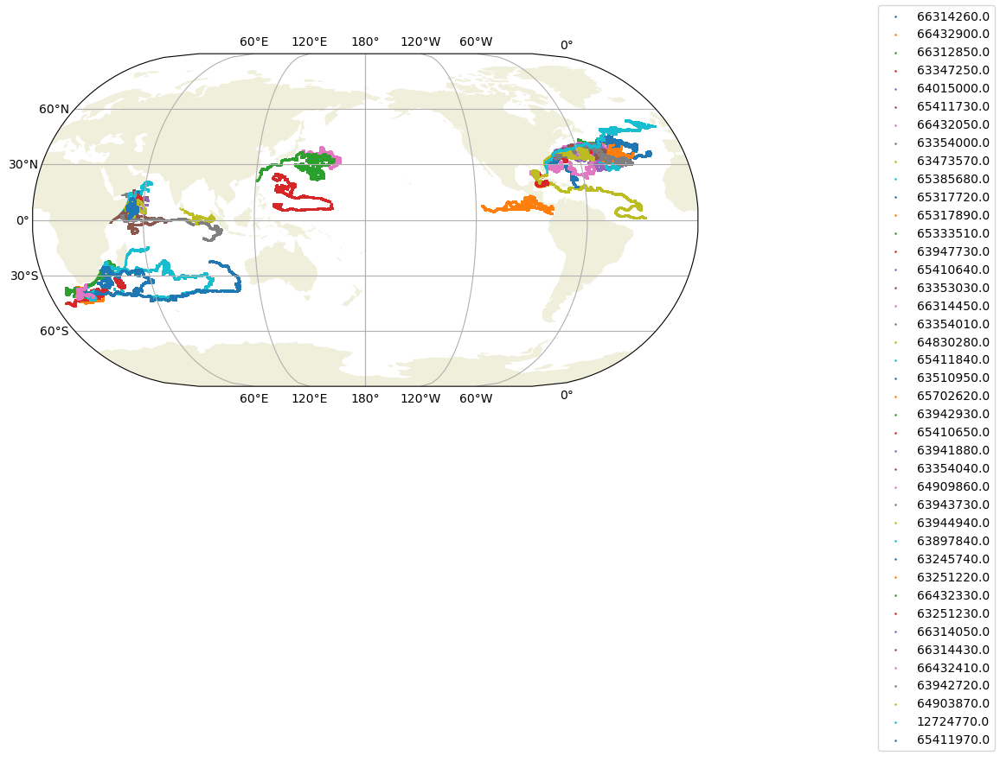

In [113]:
geo_plot(df, list_id)

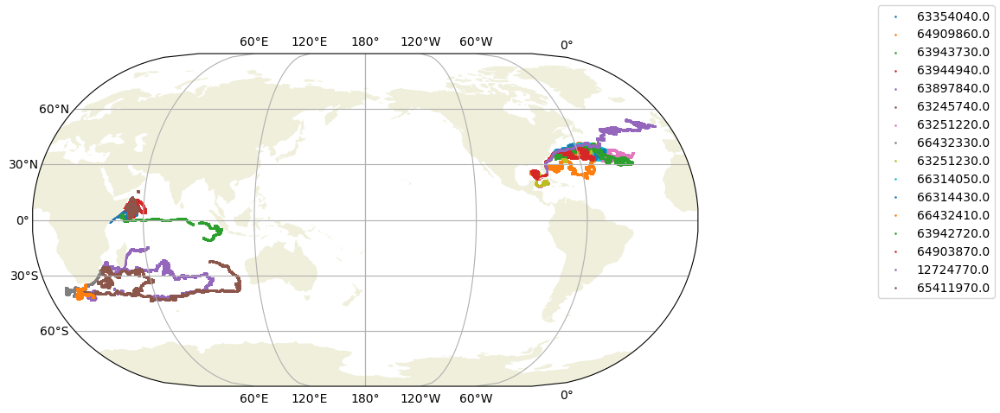

In [118]:
geo_plot(
    df,
    [
        63354040.0,
        64909860.0,
        63943730.0,
        63944940.0,
        63897840.0,
        63245740.0,
        63251220.0,
        66432330.0,
        63251230.0,
        66314050.0,
        66314430.0,
        66432410.0,
        63942720.0,
        64903870.0,
        12724770.0,
        65411970.0,
    ],
)

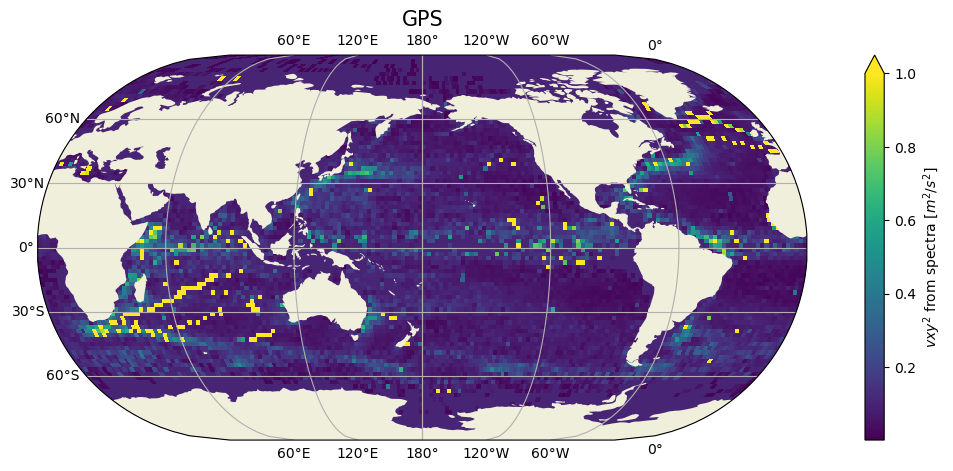

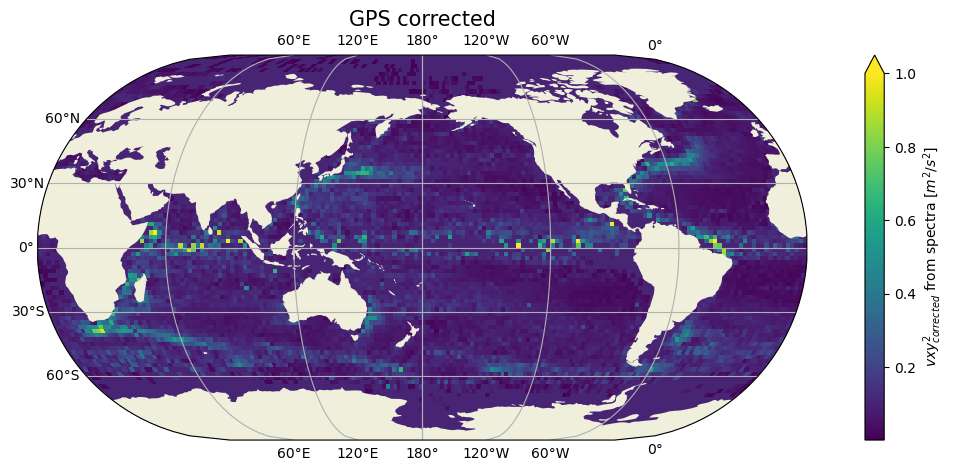

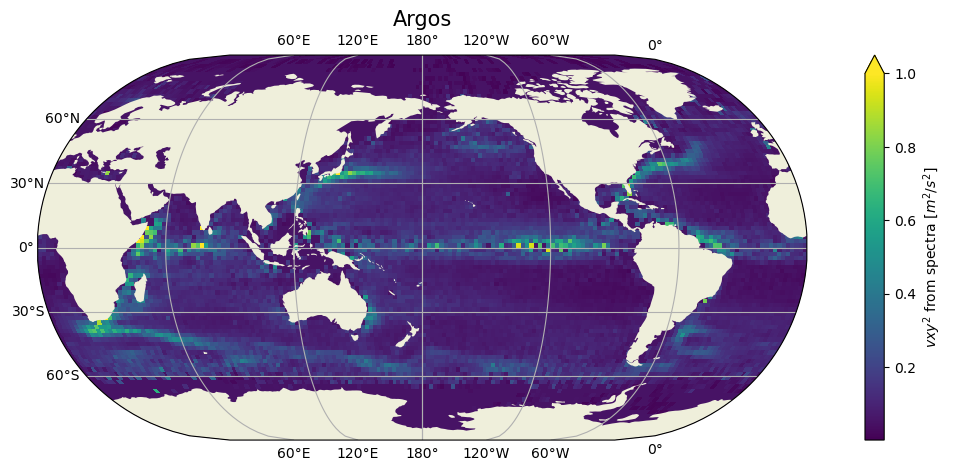

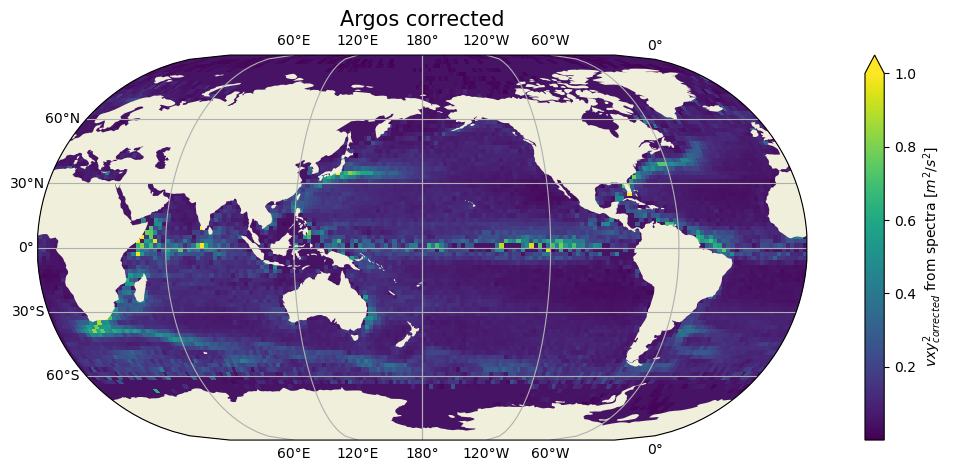

In [23]:
geo_plot(
    dsg.E_vxy.integrate("frequency"),
    legend=r"$vxy^2$ from spectra [$m^2/s^2$]",
    title="GPS",
    vmax=1,
)

geo_plot(
    dsgc.E_vxy.integrate("frequency"),
    legend=r"$vxy^2_{corrected}$ from spectra [$m^2/s^2$]",
    title="GPS corrected",
    vmax=1,
)

geo_plot(
    dsa.E_vxy.integrate("frequency"),
    legend=r"$vxy^2$ from spectra [$m^2/s^2$]",
    title="Argos",
    vmax=1,
)

geo_plot(
    dsac.E_vxy.integrate("frequency"),
    legend=r"$vxy^2_{corrected}$ from spectra [$m^2/s^2$]",
    title="Argos corrected",
    vmax=1,
)

In [96]:
crs = ccrs.PlateCarree()


def plot_traj(lon, lat, id_, figsize=(10, 10)):
    # figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111, projection=ccrs.Orthographic(lon[0], lat[0]))
    land_feature = cfeature.LAND

    # drifter

    ax.scatter(lon, lat, marker=".", s=3, transform=crs, label="drifter's trajectory")
    gl = ax.gridlines(
        draw_labels=True,
        dms=False,
        x_inline=False,
        y_inline=False,
    )
    gl.right_labels = False
    gl.top_labels = False

    # ax.set_title(label + f" colocalisation n°{nobs} \n dl={dl/1e3:.1f}km , dt={dt/60:.1f}min , matchup time = "+td.strftime("%Y/%m/%d %H:%M"))
    # fig.legend(loc="lower center",  ncol=2, fontsize=10)
    # fig.colorbar(C, label ='Sla from Aviso [m]')
    fig.tight_layout(rect=[0, 0.2, 1, 1])

time
161510.0   -79.791618
161511.0   -79.793098
161512.0   -79.795120
161513.0   -79.797348
161514.0   -79.799820
              ...    
177500.0   -19.241690
177501.0   -19.240879
177502.0   -19.238770
177503.0   -19.236080
177504.0   -19.233669
Name: lon, Length: 15995, dtype: float32

In [30]:
cluster.close()

/home1/datahome/mdemol/.miniconda3/envs/mdenv/lib/python3.9/site-packages/dask_jobqueue/core.py:237: FutureWarning: extra has been renamed to worker_extra_args. You are still using it (even if only set to []; please also check config files). If you did not set worker_extra_args yet, extra will be respected for now, but it will be removed in a future release. If you already set worker_extra_args, extra is ignored and you can remove it.
  warnings.warn(warn, FutureWarning)
/home1/datahome/mdemol/.miniconda3/envs/mdenv/lib/python3.9/site-packages/dask_jobqueue/core.py:255: FutureWarning: job_extra has been renamed to job_extra_directives. You are still using it (even if only set to []; please also check config files). If you did not set job_extra_directives yet, job_extra will be respected for now, but it will be removed in a future release. If you already set job_extra_directives, job_extra is ignored and you can remove it.
  warnings.warn(warn, FutureWarning)
/home1/datahome/mdemol/.min